<a href="https://colab.research.google.com/github/nurikahraman/FoodTracker/blob/main/Check_Blurry_in_Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import argparse
from imutils import paths
!mkdir -p '/content/pictures'

In [4]:
import os
from google.colab.patches import cv2_imshow

def detect_blur_and_bright_spot(image_path, threshold, count):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    if image is None:
        print("Error: Image could not be read")
        return

    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply binary thresholding for bright spot detection
    _, binary_image = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)

    # Apply Laplacian filter for edge detection
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)

    # Calculate maximum intensity and variance
    _, max_val, _, _ = cv2.minMaxLoc(gray)
    binary_variance = binary_image.var()
    laplacian_variance = laplacian.var()

    # Initialize result variables
    blur_text = "Not Blurry"
    bright_spot_text = "No Bright Spot"

    # Check blur condition based on variance of Laplacian image
    if laplacian_variance < threshold:
        blur_text = "Blurry"
        # Add labels to the image
        cv2.putText(image, blur_text, (15, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 3)
        cv2.imwrite(os.path.join(os.path.expanduser('~'),'/content/', f'{count} BLUR_image.jpg'), image)
    else:
        cv2.putText(image, "{}: {:.2f}".format(blur_text, laplacian_variance), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 3)
        cv2.imwrite(os.path.join(os.path.expanduser('~'),'/content/', f'{count} clear_image.jpg'), image)


    # Check bright spot condition based on variance of binary image
    if 5000 < binary_variance < 8500:
        bright_spot_text = "Bright Spot"
        # Add labels to the image
        cv2.putText(image, bright_spot_text, (15, 75), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 3)
        cv2.imwrite(os.path.join(os.path.expanduser('~'),'/content/', f'{count} BRIGHT_image.jpg'), image)

    cv2_imshow(image)

# Python program to find largest
# number in a list

# Creating an empty list
#list1 = []

# asking number of elements to put in list
#num = int(input("Enter number of elements in list: "))

# Iterating till num to append elements in list
#for i in range(1, num + 1):
#    ele = int(input("Enter elements: "))
#    list1.append(ele)

# Printing maximum element
#print("Largest element is:", max(list1))
    cv2.waitKey(0)

main:  ['/content/pictures/fridge_9.jpg', '/content/pictures/fridge_16.jpg', '/content/pictures/fridge_6.jpg', '/content/pictures/fridge_3.jpg', '/content/pictures/fridge_7.jpg', '/content/pictures/fridge_10.jpg', '/content/pictures/fridge_13.jpg', '/content/pictures/fridge_2.jpg', '/content/pictures/fridge_18.jpg', '/content/pictures/fridge_14.jpg', '/content/pictures/fridge_15.jpg', '/content/pictures/fridge_12.jpg', '/content/pictures/fridge_11.jpg', '/content/pictures/fridge_8.jpg', '/content/pictures/fridge_0.jpg', '/content/pictures/fridge_4.jpg', '/content/pictures/fridge_1.jpg', '/content/pictures/fridge_5.jpg', '/content/pictures/fridge_17.jpg', '/content/pictures/fridge_19.jpg']


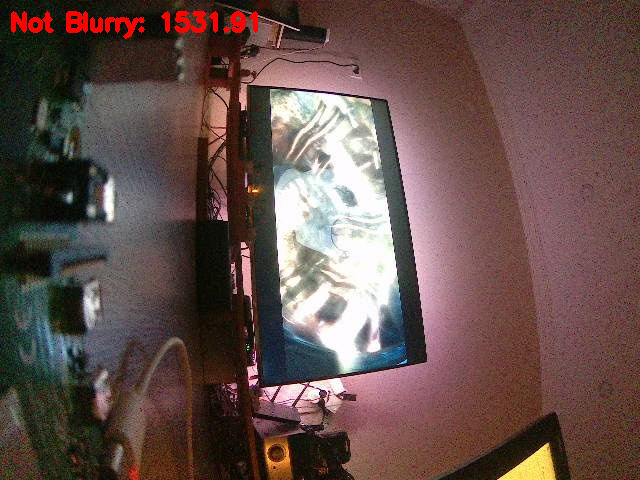

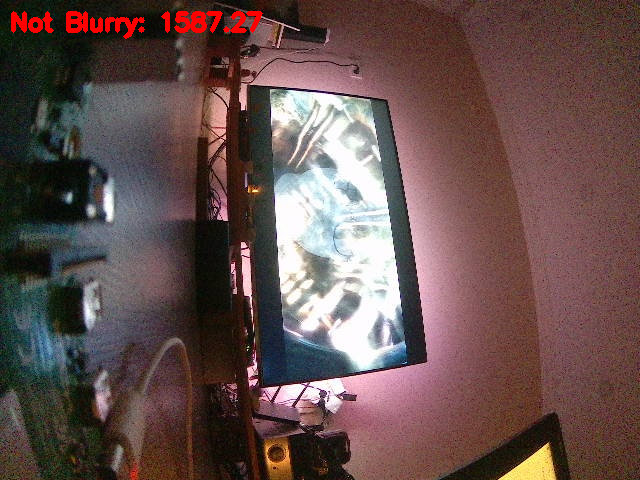

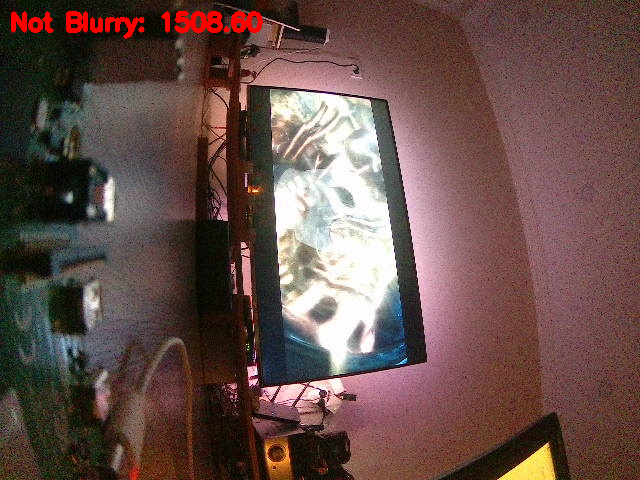

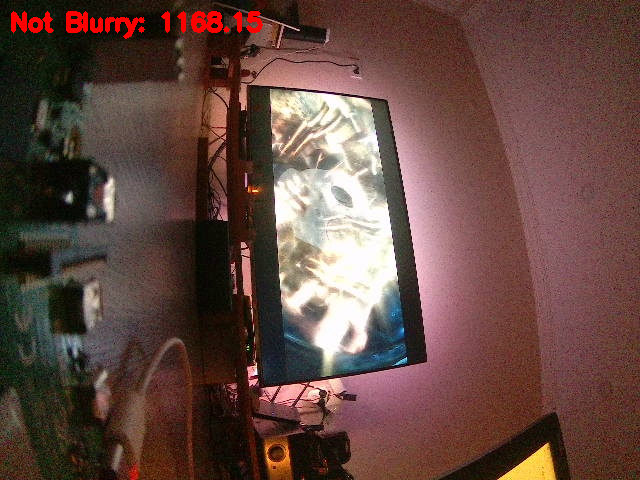

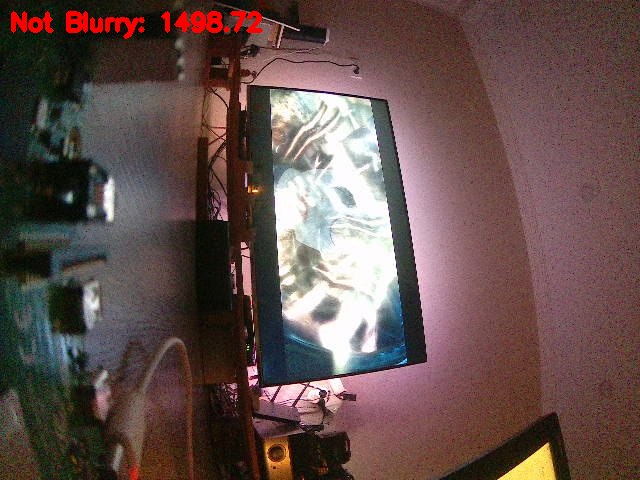

...

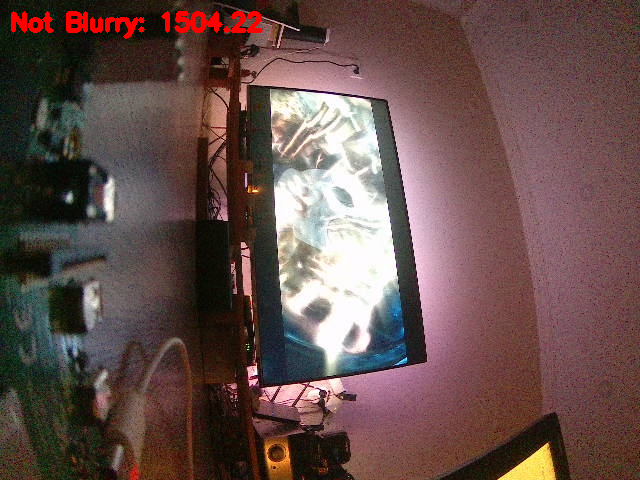

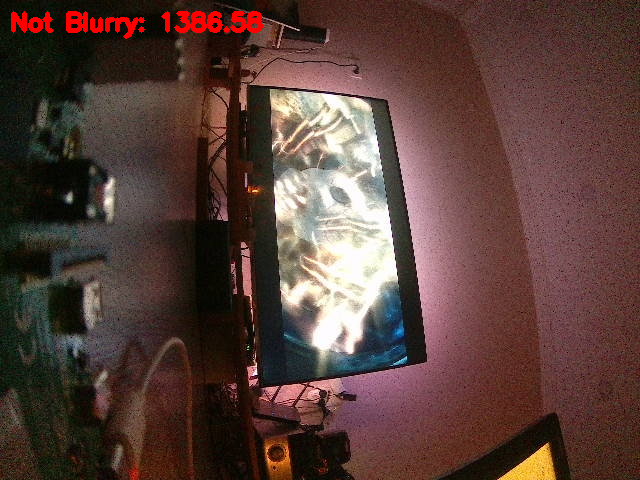

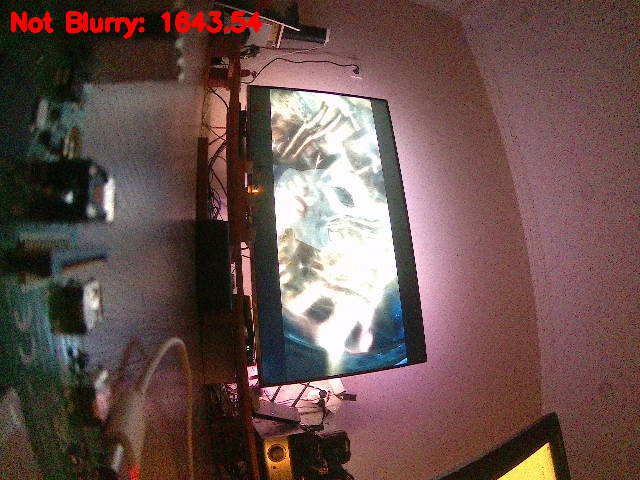

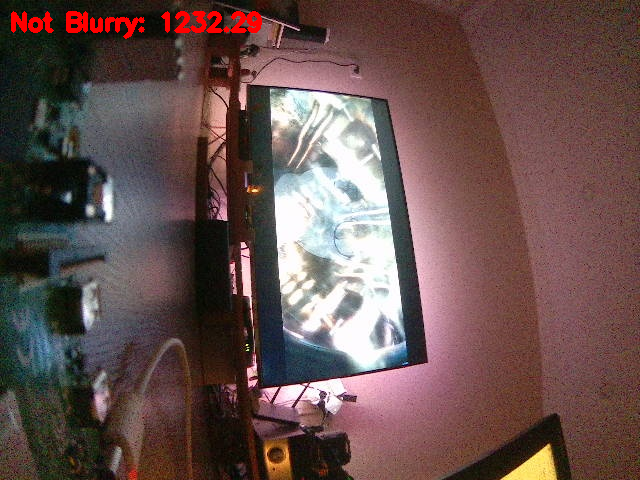

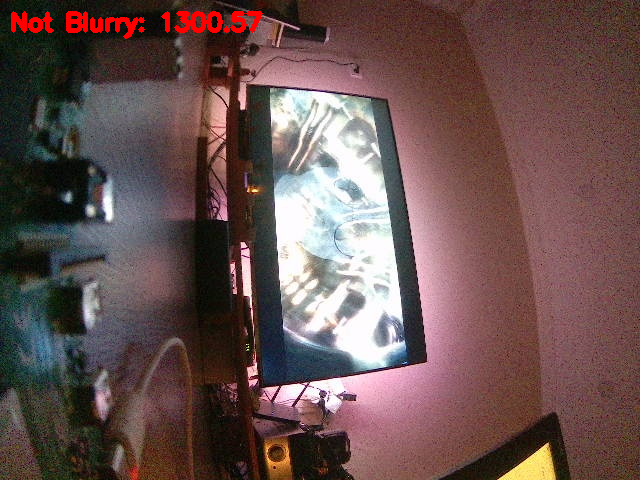

In [3]:
def main(pth, th):

    i=0

    # Get all image paths in the input folder
    image_paths = list(paths.list_images(pth))

    print('main: ', image_paths)

    # Process each image
    for image_path in image_paths:
        detect_blur_and_bright_spot(image_path, th, i)
        i = i + 1
    # ...

if __name__ == "__main__":
    main("/content/pictures", 100)